# Test second order contamination in Ron400 hologram with FGB37 filter scanning
==================================================================================================

- author : Jérémy Neveu
- date   : June 9th 2017


In [1]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

ScanRon400_FGB37
ccdproc version 1.2.0
bottleneck version 1.2.0
/Users/jneveu/Documents/LSST/Calibration/CTIOAnaJun2017/ana_09jun17/ScanRon400_FGB37


### Input directory

In [6]:
inputdir="../OverScanRemove/trim_images"
tag = "trim"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_09jun17/"
MIN_IMGNUMBER=4
MAX_IMGNUMBER=28
date = "20170609"
holo_name = "Ron400"
object_name='HD111980'
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

### Output directories

In [7]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## Location of the spectra
----------------------------------

In [12]:
dirlist_all = [inputdir]
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe)

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


### Show images

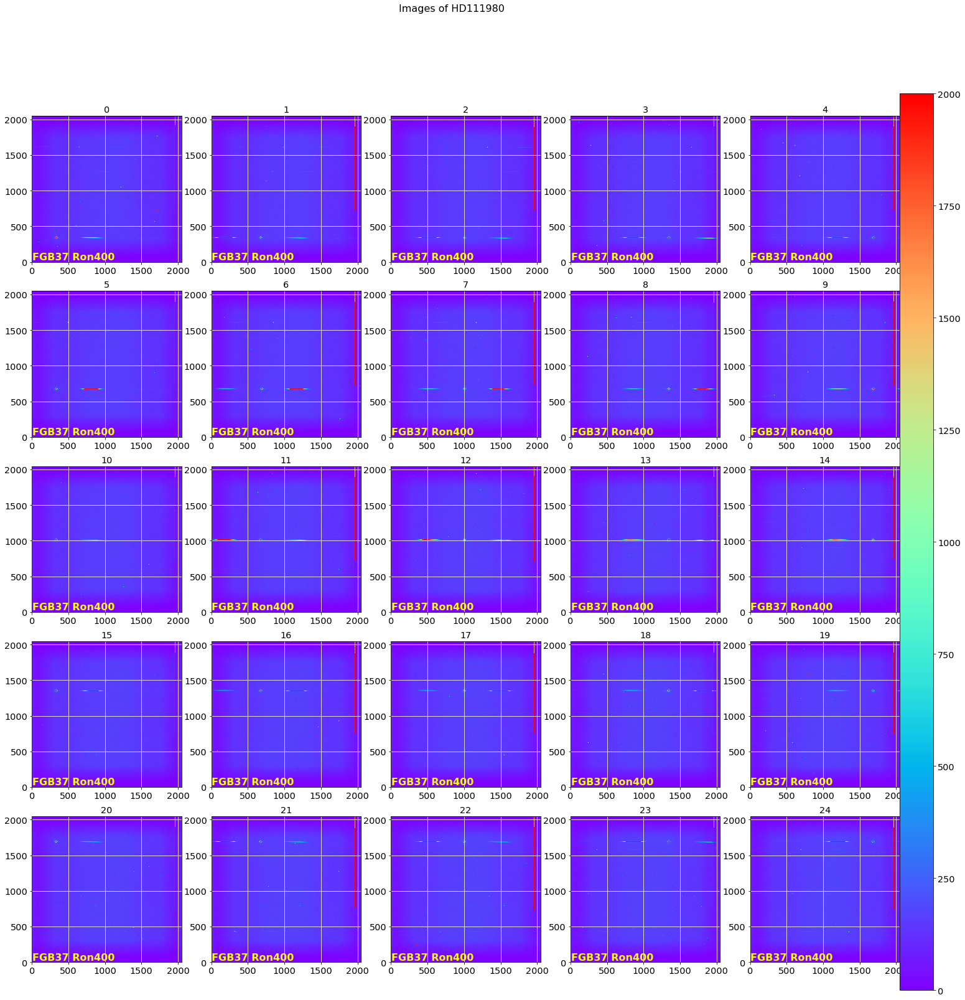

In [16]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000,downsampling=1,verbose=False)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

### Show histograms

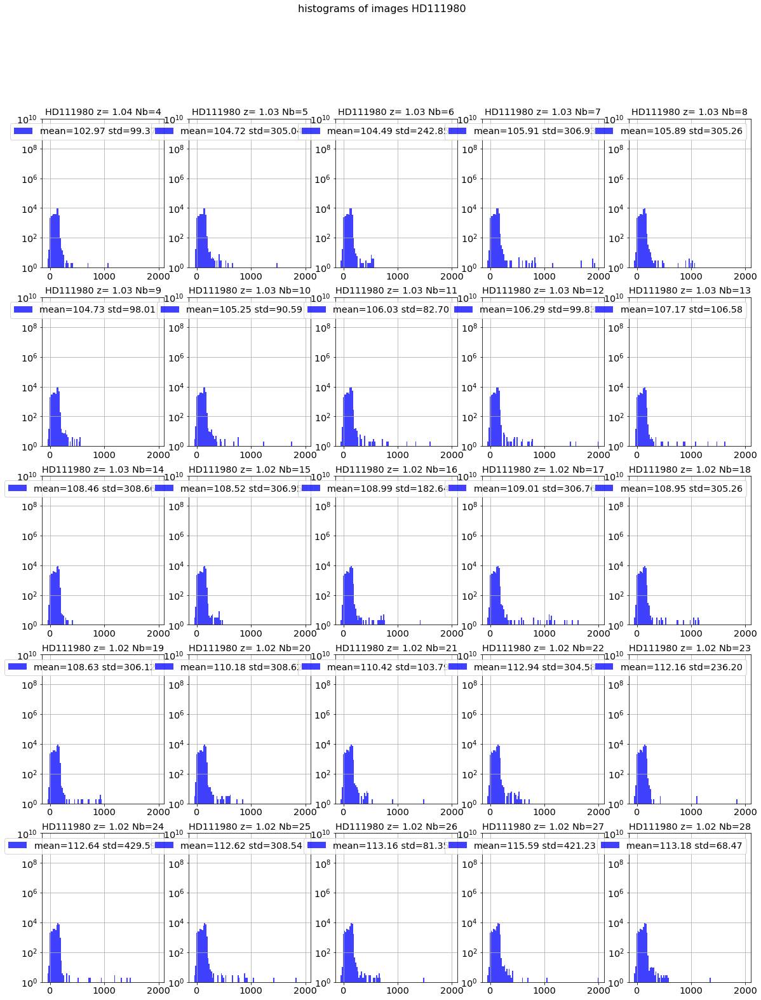

In [14]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=5,bins=100,range=(-50,2000),downsampling=10,verbose=False)

### Cut the images

To extract the spectra to analyze

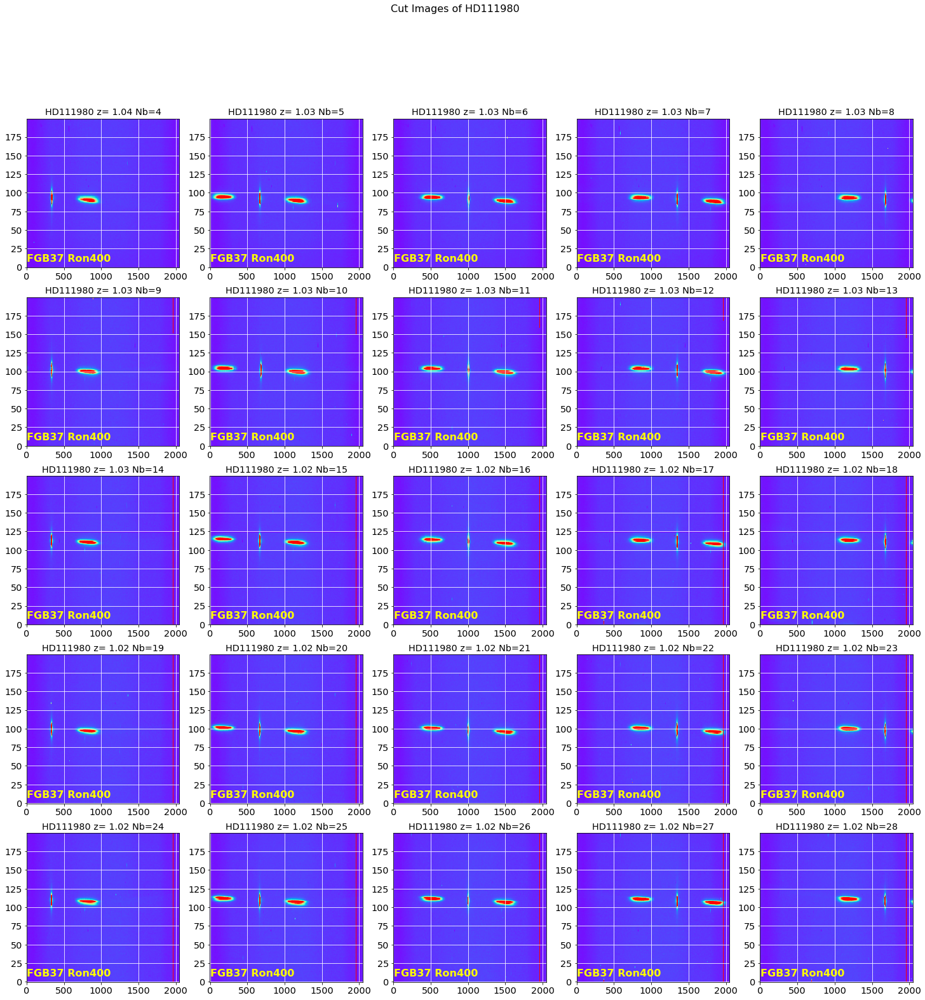

In [21]:
x_guess = [400,  700, 1000, 1300, 1600]*5
y_guess = [[350]*5, [675]*5, [1000]*5, [1350]*5, [1675]*5]
y_guess = [val for sublist in y_guess for val in sublist]
DeltaY=[100]*len(all_images)
DeltaX=[2000]*len(all_images)  # must be very large to be able to compute incident angle

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

### Save cut images

In [23]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    print short_infilename
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)

trim_20170609_004.fits
trim_20170609_005.fits
trim_20170609_006.fits
trim_20170609_007.fits
trim_20170609_008.fits
trim_20170609_009.fits
trim_20170609_010.fits
trim_20170609_011.fits
trim_20170609_012.fits
trim_20170609_013.fits
trim_20170609_014.fits
trim_20170609_015.fits
trim_20170609_016.fits
trim_20170609_017.fits
trim_20170609_018.fits
trim_20170609_019.fits
trim_20170609_020.fits
trim_20170609_021.fits
trim_20170609_022.fits
trim_20170609_023.fits
trim_20170609_024.fits
trim_20170609_025.fits
trim_20170609_026.fits
trim_20170609_027.fits
trim_20170609_028.fits


In [24]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_004.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_005.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_006.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_007.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_008.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_009.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_010.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_011.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_012.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_013.fits
-rw-r--r--  1 jneveu  staff  3288960 13 oct 21:04 cut_fitsimages/cutimg_20170609_014.fits
-rw-r--r--

# Find the optimal rotation of the spectra
============================

In [25]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

In [27]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

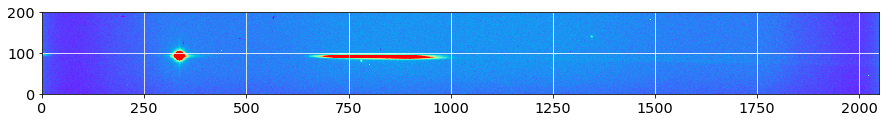

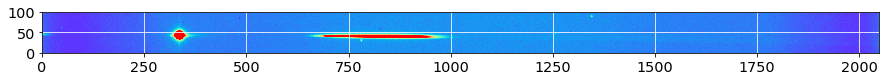

In [28]:
sel=0
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 50
right_edge = IMSIZE

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

In [29]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

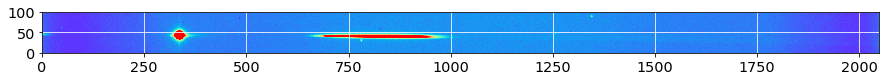

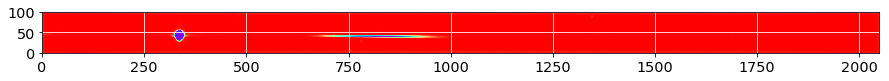

In [30]:
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 2904


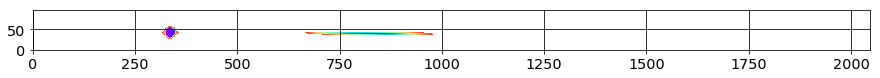

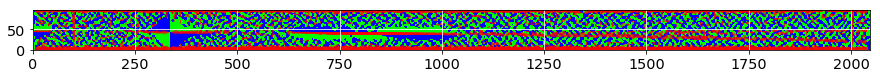

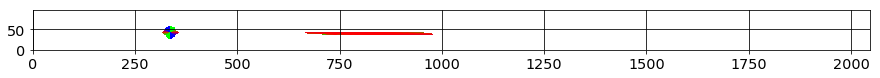

In [31]:
lambda_threshold = -7
margin_cut = 1

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 1794


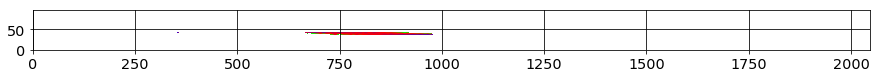

In [36]:
deg_threshold = 5

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : -0.470650624462


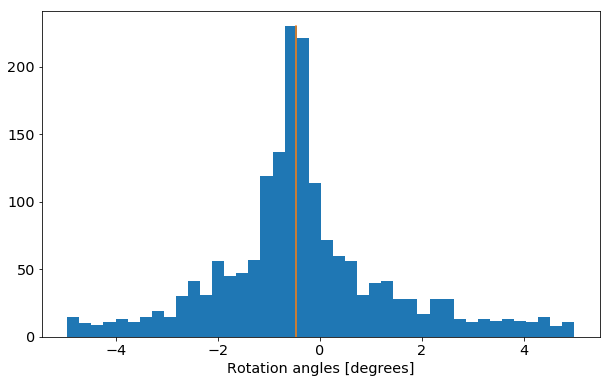

In [37]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

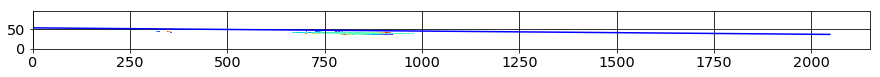

In [38]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()

On peut aussi essayer de fitter le spectre qui a été détecté par la méthode ci-dessus.

Rotation angle from fit : -0.397099247085


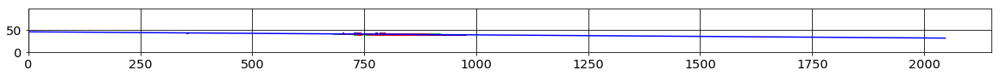

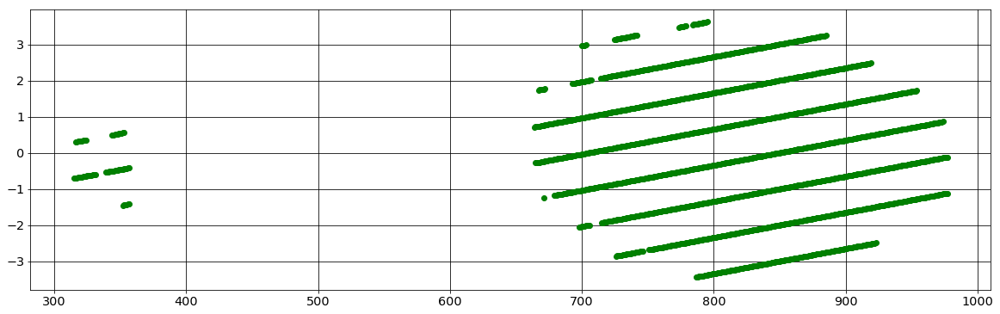

In [39]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

0  theta =  -0.470650624462
1  theta =  -0.251987223381
2  theta =  -0.315659420037
3  theta =  -0.115470692155
4  theta =  -0.0623145831259
5  theta =  -0.460459916994
6  theta =  -0.272759897816
7  theta =  -0.301225206994
8  theta =  -0.158132730843
9  theta =  -0.137397089459
10  theta =  -0.406716139002
11  theta =  -0.257190529197
12  theta =  -0.299807258802
13  theta =  -0.213755010702
14  theta =  -0.143070642911
15  theta =  -0.366512245065
16  theta =  -0.269422403942
17  theta =  -0.283339931564
18  theta =  -0.219088554578
19  theta =  -0.126915247579
20  theta =  -0.362325759043
21  theta =  -0.299482062478
22  theta =  -0.315942501766
23  theta =  -0.261472736817
24  theta =  -0.210850364508


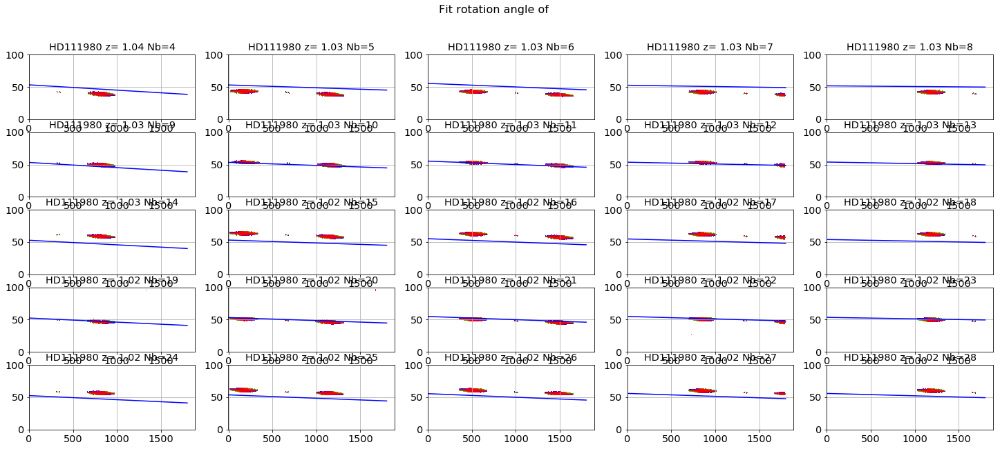

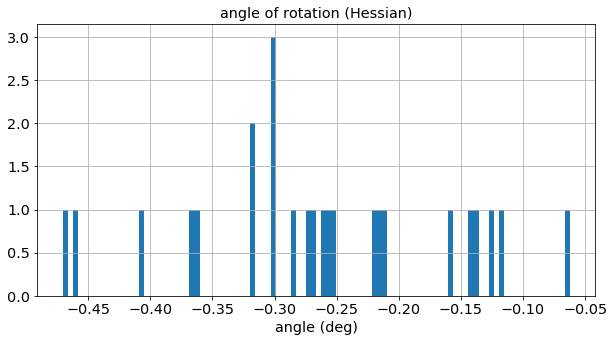

In [40]:
all_theta=ComputeRotationAngleHessian(all_images,x_guess,DeltaY,all_titles,object_name, 
   NBIMGPERROW=5, lambda_threshold = -7, deg_threshold = 5, width_cut = 50, right_edge = 1800, margin_cut=1)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

### Turn the images accordingly

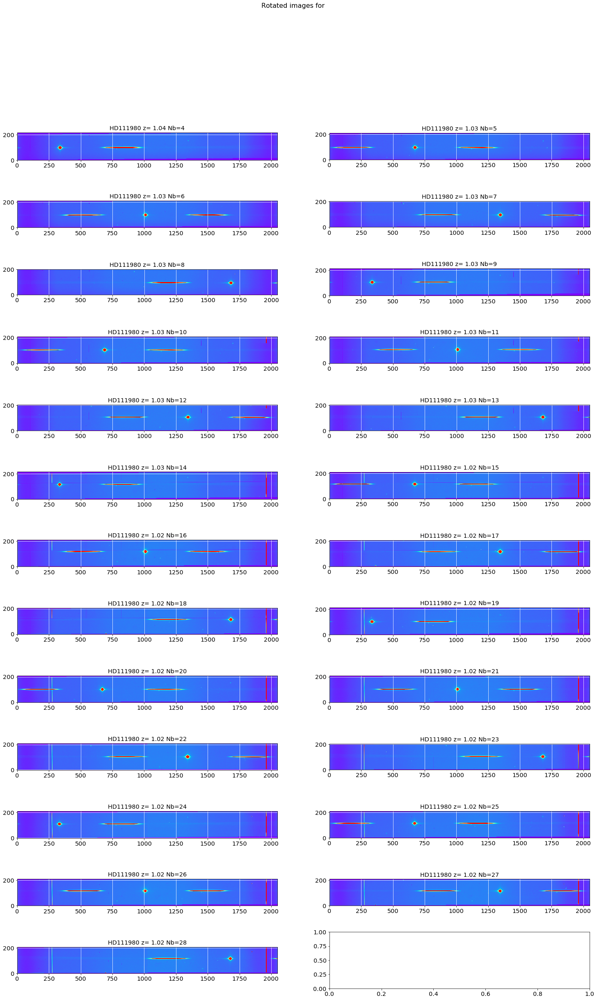

In [41]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,NBIMGPERROW=2,
                            oversample_factor=1) 
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

### Check rotation

In case of bad rotation, check by eye

array([  3.54318548e-03,  -3.74765119e-02,   3.57822884e-02,
        -2.62891879e-02,  -2.23664014e-02,  -1.28113952e-02,
        -2.43110417e-02,  -1.65561983e-02,  -1.10040537e-02,
         2.51780770e-02,   7.38993993e-05,  -4.33527686e-02,
        -1.25139756e-02,   7.40349092e-04,  -7.67944557e-03,
        -2.99090714e-02,  -5.87755842e-03,  -4.06656338e-03,
        -1.67406967e-02,  -8.17425351e-03,  -1.85349965e-02,
        -9.32688298e-03,   4.18710117e-02,  -1.06455603e-03,
        -1.91877220e-02])

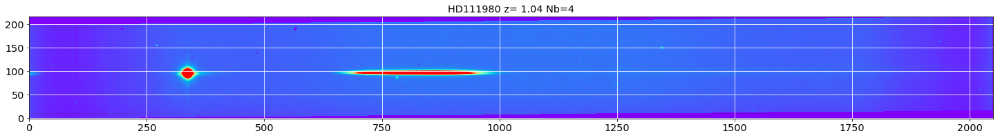

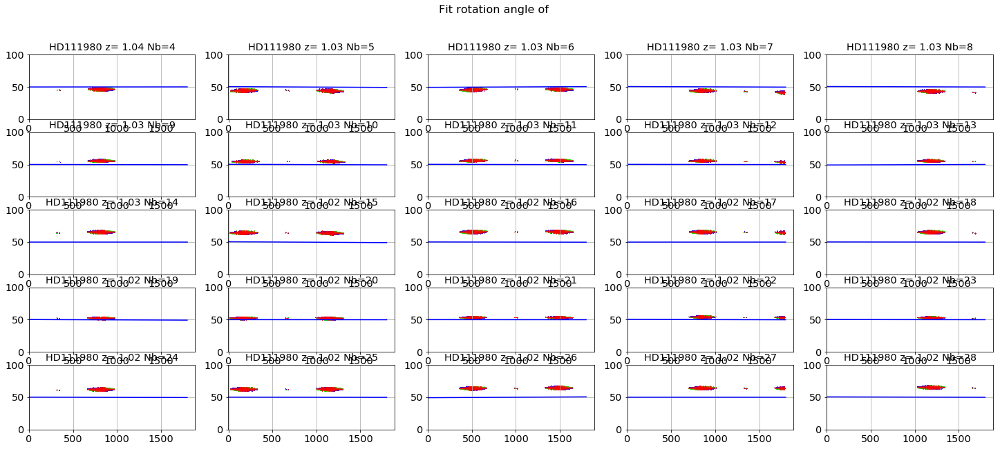

In [42]:
sel=0
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessian(turned_images,x_guess,DeltaY,all_titles,object_name, 
            NBIMGPERROW=5, lambda_threshold = -7, deg_threshold = 5, width_cut = 50, right_edge = 1800)

Cut the extra spectra that pollute the images.

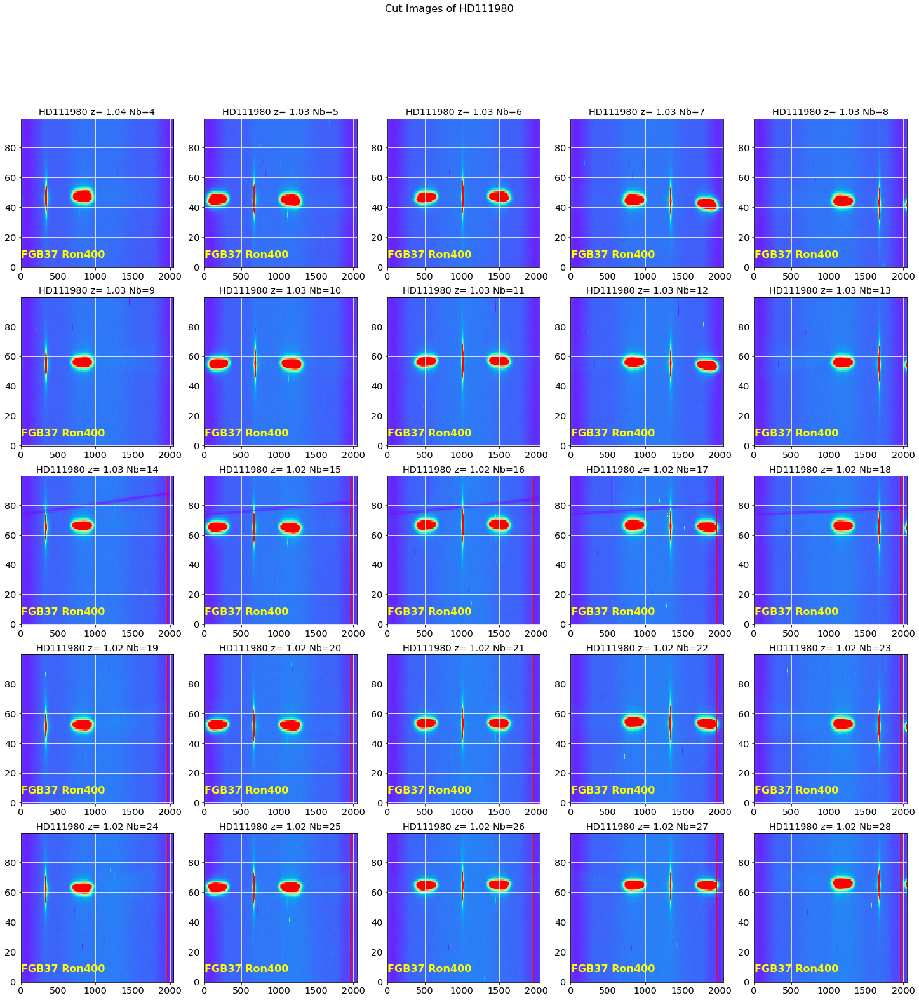

In [44]:
DeltaY_rot2 = [50]*len(all_images)
y_guess_rot2 = [100]*len(all_images)
images_cut_rot=ShowCenterImages(x_guess,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=1000) 

# Find the central star locations
======================================

### Central star positions after rotation

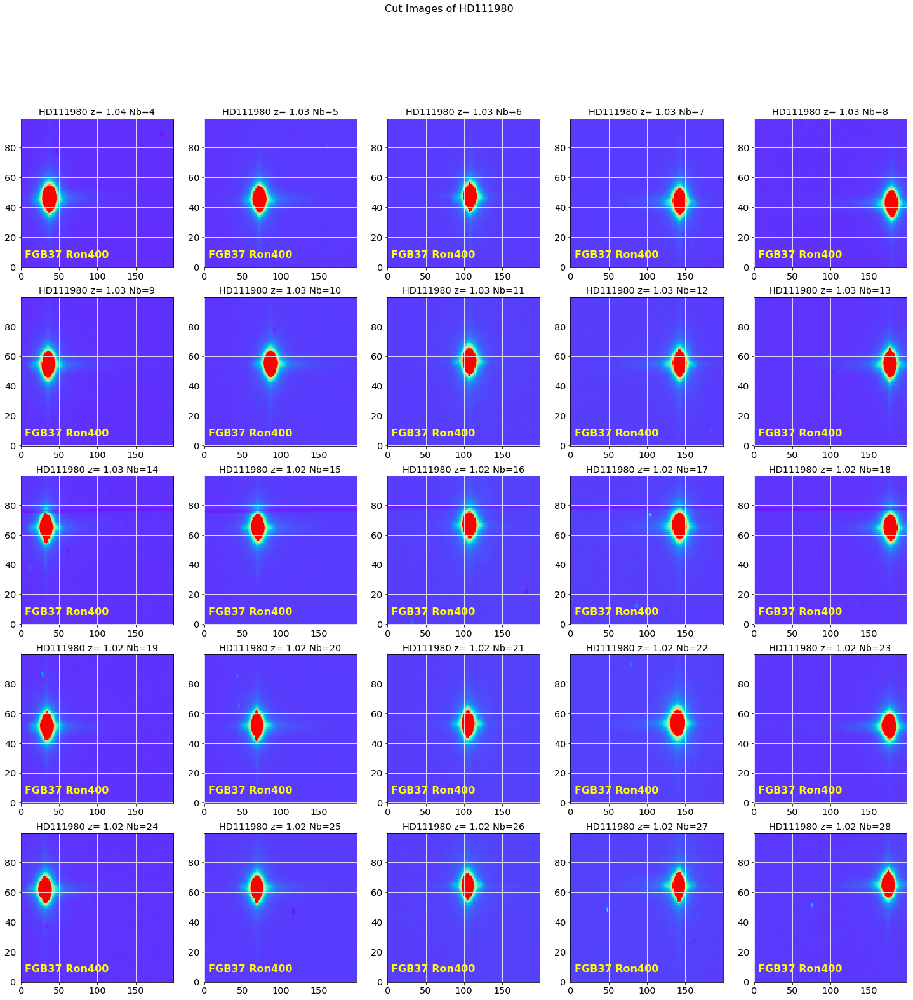

In [45]:
x_guess_rot = x_guess
y_guess_rot = DeltaY_rot2
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)

images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [47]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=20,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  146.078509354 125.847374566 93.9687732596
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 36.6921094569 45.6755872929 ... 60596.9060611 17.4322740799 -3.10338511377
----------------------------------------------------------------
1  mean, median, std =  163.998271031 147.234790857 85.3007180021
 id  xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------ ------------- ... ------------- ------------- --------------
  1 72.067976043 45.1032587446 ... 60573.9626417 18.6174363046 -3.17479969169
----------------------------------------------------------------
2  mean, median, std =  170.101120325 155.464803176 71.8783607826
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- -------

### Central star position

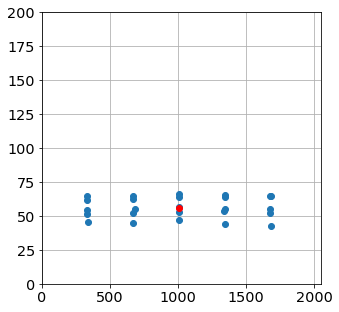

In [48]:
x_star = []
y_star = []
for index,s in enumerate(img_sources):
    thestar = None
    test = -1
    for ss in s:
        x_star.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
        y_star.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_star)
y_mean = np.mean(y_star)
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

## Pointing positions before rotations

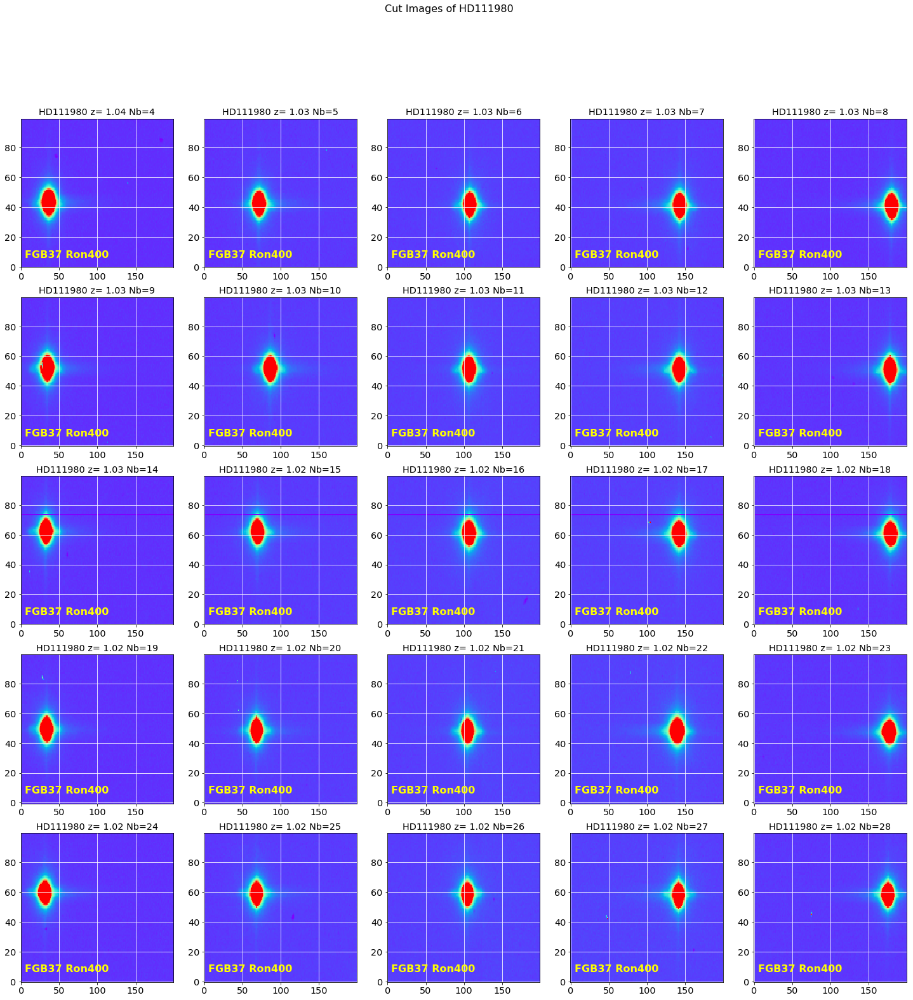

In [49]:
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)
images_raw_cut=ShowCenterImages(x_guess,DeltaY,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [50]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=20,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  146.628551136 128.0 97.0726179414
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 35.6178170723 42.8179237371 ... 60595.0 17.2073092763 -3.08928241146
----------------------------------------------------------------
1  mean, median, std =  163.492241379 148.0 80.8082675605
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 71.5730237651 42.1378900066 ... 60574.0 19.9412631095 -3.24938165928
----------------------------------------------------------------
2  mean, median, std =  170.477919181 157.0 72.3821990382
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 107.093652733 41.3220230646 ... 60565.0 21.

[[  335.61781707   342.81792374]
 [  671.57302377   342.13789001]
 [ 1007.09365273   341.32202306]
 [ 1342.77359408   341.097784  ]
 [ 1679.91544472   340.67623035]
 [  333.61422902   676.79726909]
 [  686.11731384   676.32632383]
 [ 1006.23893487   675.98413911]
 [ 1342.16786959   675.87787296]
 [ 1677.87320717   675.72027001]
 [  331.72021112  1011.81533043]
 [  669.55762262  1011.78487391]
 [ 1006.24801146  1010.75932603]
 [ 1342.08800847  1010.2420412 ]
 [ 1678.62429374  1010.22974607]
 [  332.8415998   1349.28040991]
 [  668.19986593  1348.64965903]
 [ 1004.43896179  1348.04916971]
 [ 1339.66331815  1348.11073468]
 [ 1677.05980048  1347.82508457]
 [  330.65710519  1684.31486253]
 [  668.21310148  1683.7163719 ]
 [ 1004.04106159  1683.37816362]
 [ 1341.23052102  1683.14803261]
 [ 1675.14276666  1683.34928933]]
[336.69210945685666, 672.06797604298731, 1007.6773014291837, 1342.7829545717364, 1679.9367078009097, 334.61694578145489, 686.64783657623832, 1006.7757555220328, 1342.70292737

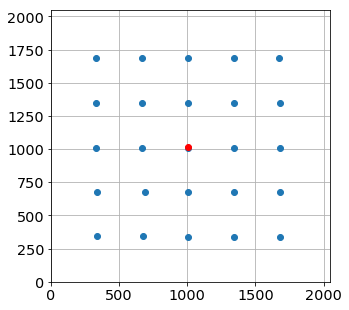

In [51]:
x_pointing = []
y_pointing = []
for index,s in enumerate(img_sources):
    for ss in s:
        x_pointing.append(ss['xcentroid']+x_guess[index]-DeltaX_rot[index])
        y_pointing.append(ss['ycentroid']+y_guess[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions
print x_star
plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

## Save results

In [52]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

./rotated_fitsimages/star_centroids.txt
total 80616
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_004.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_005.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_006.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_007.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_008.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_009.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_010.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_011.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_012.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_013.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_014.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:08 rotimg_20170609_015.fits
-rw-r--r--  1 jneveu  staff  1650240 13 oct 21:0

# Extract spectra
===================================

In [53]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

In [55]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


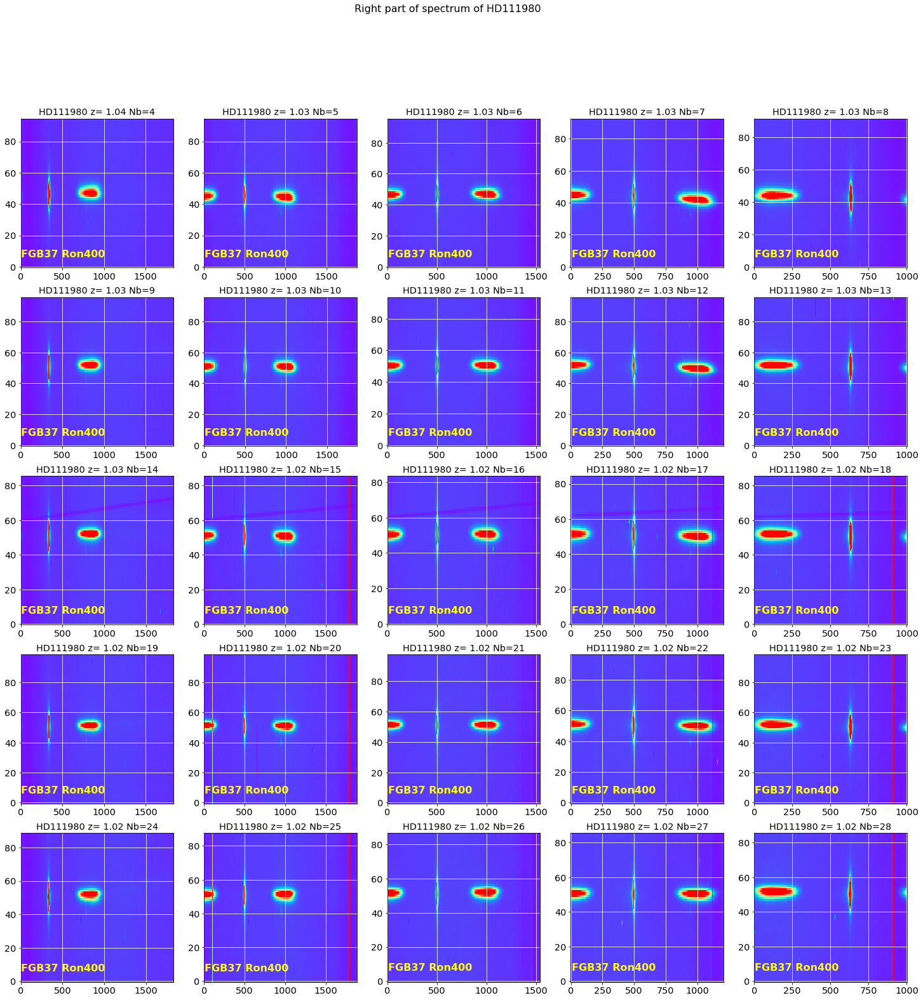

In [60]:
# Right spectrum
x_guess_right = []
for x in x_star :
    x_guess_right.append(min(IMSIZE-1,x+500))
ShowCenterImages(x_guess_right,y_star,[1000]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

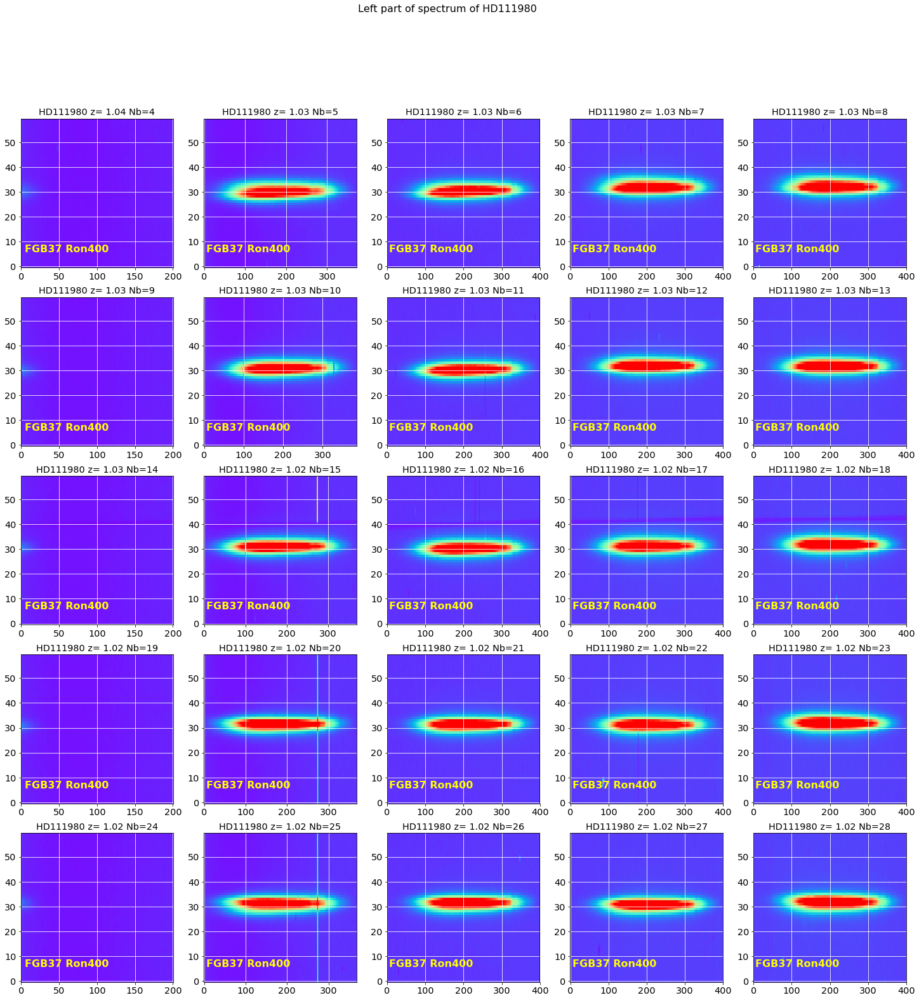

In [61]:
# Left spectrum
x_guess_left = []
for x in x_star :
    x_guess_left.append(max(1,x-500))
ShowCenterImages(x_guess_left,y_star,[200]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

### Extraction

[46,
 45,
 46,
 44,
 44,
 55,
 55,
 56,
 55,
 55,
 66,
 65,
 66,
 66,
 65,
 52,
 52,
 53,
 54,
 53,
 63,
 63,
 65,
 65,
 66]

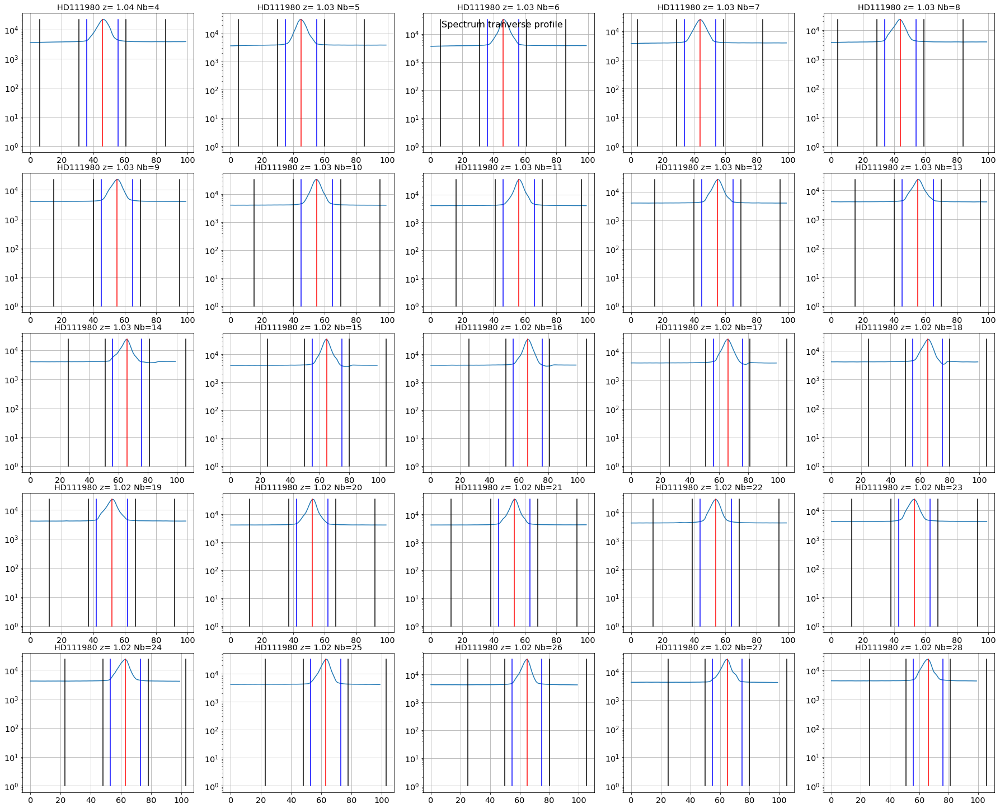

In [62]:
ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=5,DeltaX=1000,w=10,ws=[15,40],right_edge=1800)

In [93]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(y_star,all_images,all_titles,object_name,all_expo,
                                                      w=10,ws=[10,20],right_edge=IMSIZE)

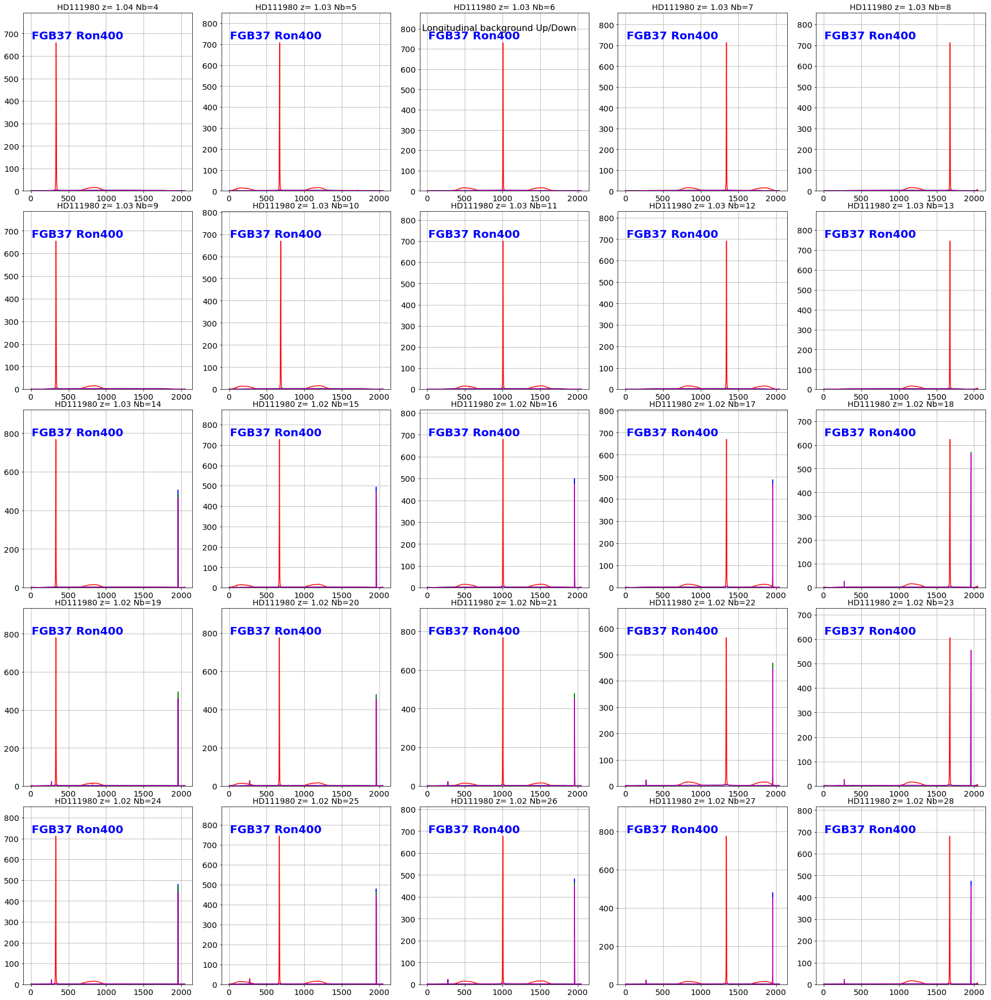

In [94]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=5,right_edge=IMSIZE)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

(0, 100.0)

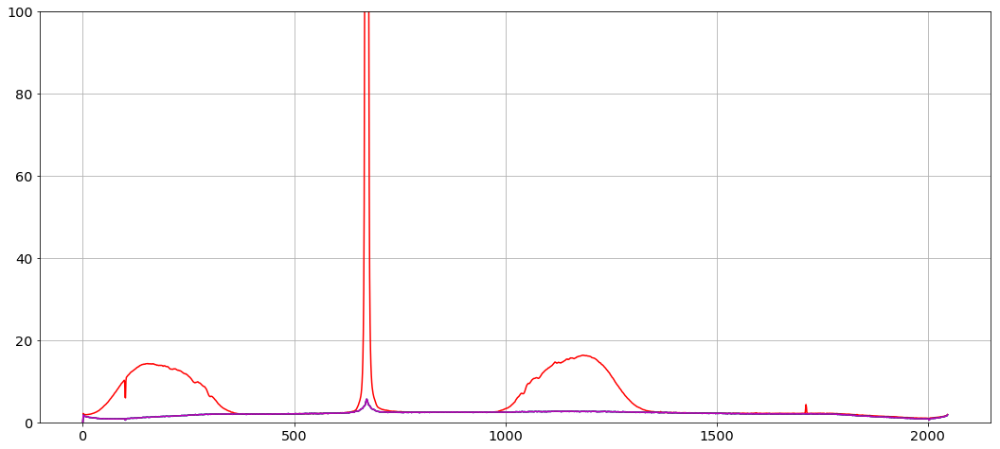

In [95]:
sel=1
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,100.)

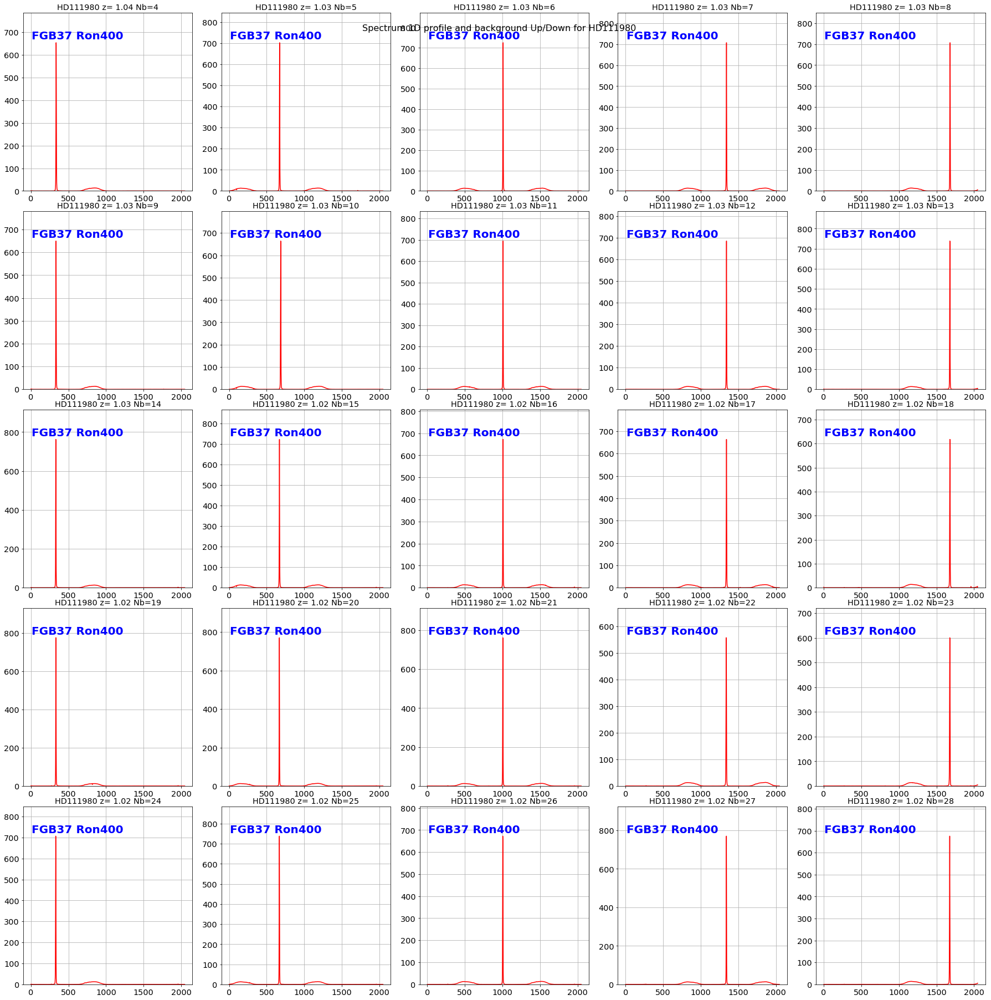

In [96]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

# Grating characterisation

FGB37 Ron400:	 gaussian center x=336.63+/-0.04
FGB37 Ron400:	 gaussian center x=672.09+/-0.03
FGB37 Ron400:	 gaussian center x=1007.64+/-0.04
FGB37 Ron400:	 gaussian center x=1342.81+/-0.03
FGB37 Ron400:	 gaussian center x=1680.02+/-0.04
FGB37 Ron400:	 gaussian center x=334.49+/-0.04
FGB37 Ron400:	 gaussian center x=686.61+/-0.03
FGB37 Ron400:	 gaussian center x=1006.75+/-0.03
FGB37 Ron400:	 gaussian center x=1342.70+/-0.03
FGB37 Ron400:	 gaussian center x=1677.93+/-0.04
FGB37 Ron400:	 gaussian center x=332.02+/-0.04
FGB37 Ron400:	 gaussian center x=669.98+/-0.04
FGB37 Ron400:	 gaussian center x=1006.76+/-0.04
FGB37 Ron400:	 gaussian center x=1342.61+/-0.04
FGB37 Ron400:	 gaussian center x=1678.66+/-0.04
FGB37 Ron400:	 gaussian center x=333.32+/-0.04
FGB37 Ron400:	 gaussian center x=668.70+/-0.03
FGB37 Ron400:	 gaussian center x=1004.99+/-0.03
FGB37 Ron400:	 gaussian center x=1340.23+/-0.03
FGB37 Ron400:	 gaussian center x=1677.21+/-0.04
FGB37 Ron400:	 gaussian center x=331.09+/-0.04
F

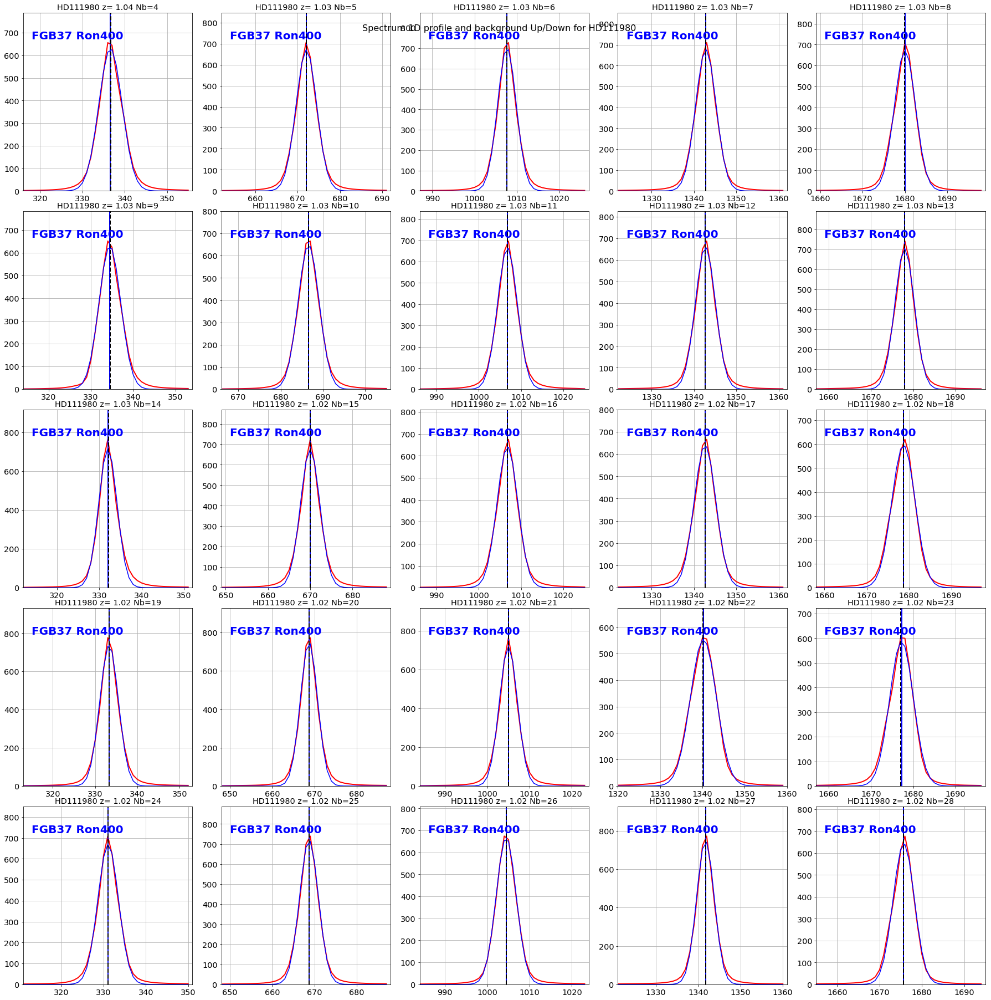

In [67]:
# Zero order profile
xlims_zero = []
for x in x_star :
    xlims_zero.append([x-20,x+20])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                       xlim=xlims_zero,guess=[10,800,100],vertical_lines=x_star)
print 'CCDPROC star centers:'
print x_star

## Second order contamination

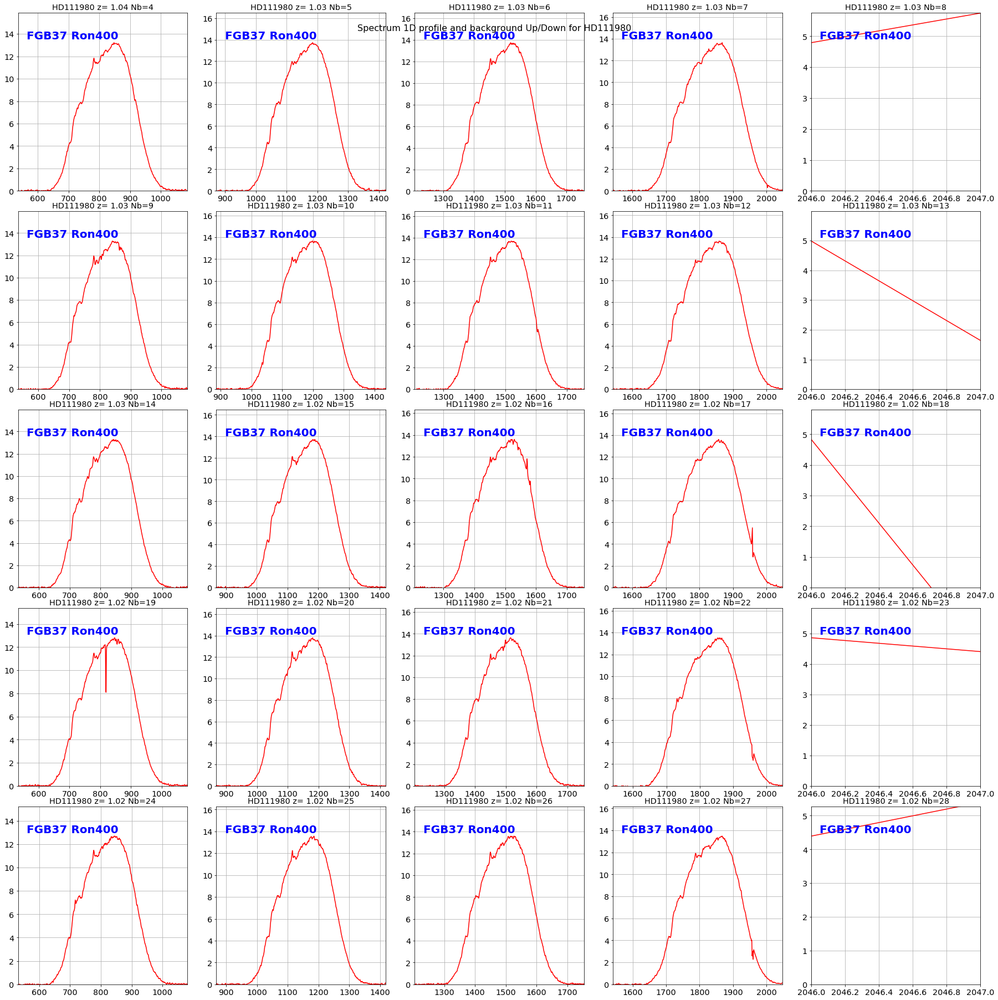

In [110]:
# Order +1 spectrum profile
right_edge = thecorrspectra[0].shape[0]
xlims_right1 = []
for x in x_guess_right :
    if x == right_edge-1 :
        xlims_right1.append([IMSIZE-2,IMSIZE-1])
    else :
        xlims_right1.append([max(1,min(right_edge-2,int(x-300))),min(right_edge-1,int(x+250))])
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,xlim=xlims_right1)

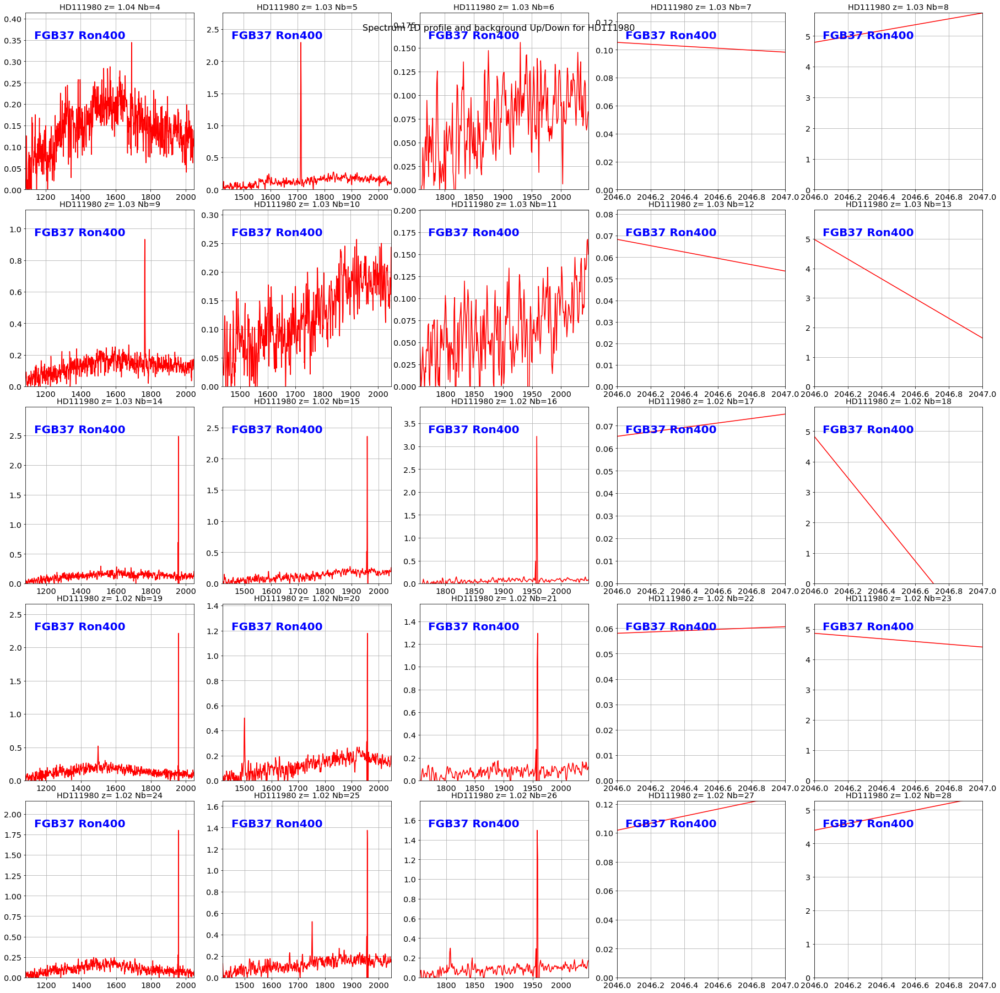

In [155]:
# Order +2 spectrum profile
right_edge = thecorrspectra[0].shape[0]
xlims_right2 = []
for x in x_guess_right :
    if x == right_edge-1 :
        xlims_right2.append([IMSIZE-2,IMSIZE-1])
    else :
        xlims_right2.append([max(1,min(right_edge-2,int(x+250))),min(right_edge-1,int(x+1350))])
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,xlim=xlims_right2)

On ne garde que les 3 premiers spectres d'une ligne.

In [185]:
indices = []
for index in range(len(thecorrspectra)) :
    if index % 5 == 3 or index % 5 == 4 : continue
    indices.append(index)
indices = np.array(indices)
print indices

[ 0  1  2  5  6  7 10 11 12 15 16 17 20 21 22]


Extraction de l'ordre 1

 MAIN_ID        RA           DEC      ... SP_QUAL_35    SP_BIBCODE_35   
             "h:m:s"       "d:m:s"    ...                               
--------- ------------- ------------- ... ---------- -------------------
HD 185975 20 28 18.7284 -87 28 19.941 ...          C 1975MSS...C01....0H
-------------------------------------
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_001.fits
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_002.fits
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_003.fits


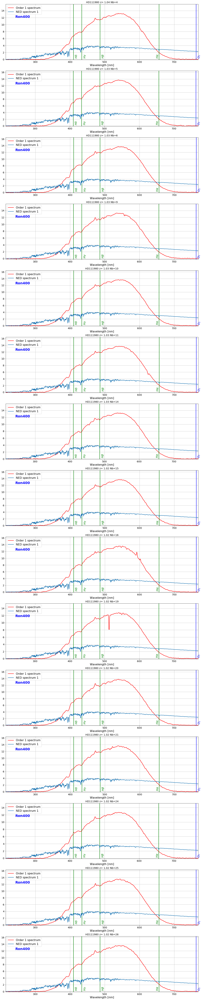

In [187]:
from holo_specs import *
all_grat = []
for f in all_filt :
    all_grat.append(f.replace('FGB37 ',''))

CALSPEC = Target("HD185975")
print '-------------------------------------'

#### 
order = 1
xlims = xlims_right1
####

holo = Hologram(all_grat[0],verbose=False)
specs1 = []
for index in indices :
    specs1.append(extract_spectrum(thecorrspectra[index],holo,
                xlims[index],x_star[index],order0_positions[index],order=order))

PlotCalibratedSpectra(specs1,0,[all_titles[i] for i in indices],object_name,[all_grat[i] for i in indices],
    target=CALSPEC,order=order,atmospheric_lines=True,hydrogen_only=True,
                 verbose=False,nofit=True,dir_top_images=dir_top_images) 

Extraction de l'ordre 2

Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_001.fits
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_002.fits
Loading /Users/jneveu/Documents/LSST/Calibration/CDBS/calspec/hd185975_stis_003.fits


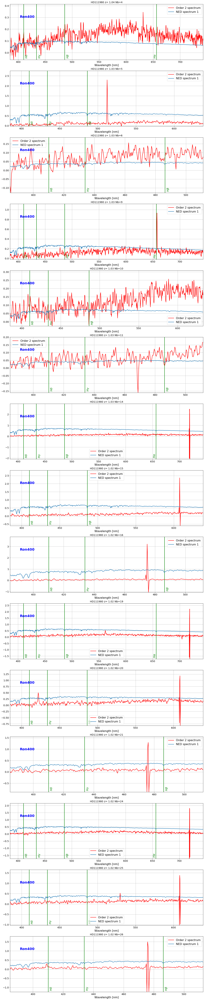

In [186]:
#### 
order = 2
xlims = xlims_right2
####

specs2 = []
for index in indices :
    specs2.append(extract_spectrum(thecorrspectra[index],holo,
                xlims[index],x_star[index],order0_positions[index],order=order))

PlotCalibratedSpectra(specs2,0,[all_titles[i] for i in indices],object_name,[all_grat[i] for i in indices],
    target=CALSPEC,order=order,atmospheric_lines=True,hydrogen_only=True,
                 verbose=False,nofit=True,dir_top_images=dir_top_images) 

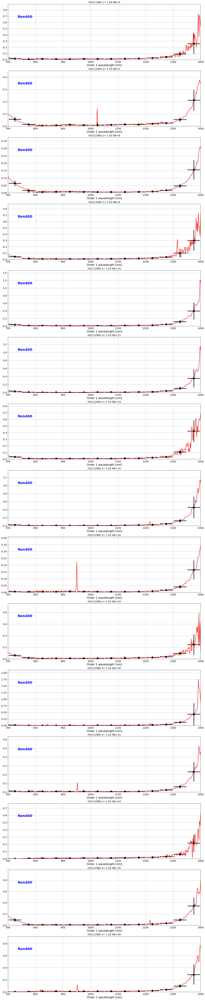

In [218]:
lambdas = np.arange(350,701,1)
ratios = EstimateSecondOrderRatios(specs1,specs2,lambdas,
            [all_titles[i] for i in indices],object_name,[all_grat[i] for i in indices],
            bin_width=25,verbose=False,dir_top_images=dir_top_images)

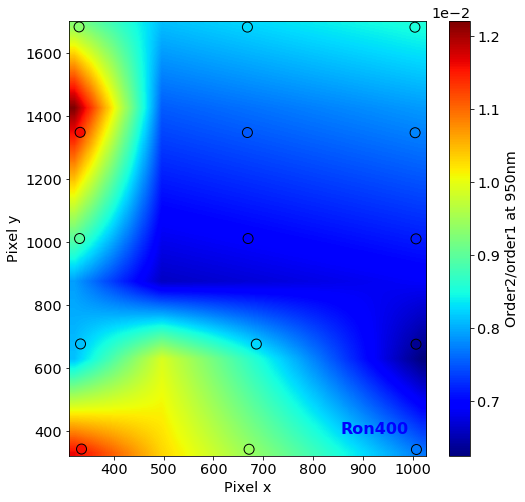

In [225]:
contamination = []
for index in range(len(ratios)):
    lambdas = ratios[index][0]
    lambdas_indices = np.where(np.logical_and(lambdas > 900, lambdas < 1000))
    contamination.append(np.median(ratios[index][1][lambdas_indices]))
    #binned_ratio_err.append(np.std(ratio[lambdas_indices]))

cont_xx,cont_yy,cont_z,cont_interp = scatter_interpol([order0_positions[i] for i in indices],contamination,margin=10,
                            kind='linear',plot=True,holo_name=holo_name,zlabel='Order2/order1 at 950nm')
figfilename=os.path.join(dir_top_images,'contamination_map.pdf')
plt.savefig(figfilename)   

## Save grating resolution

In [162]:
N = []
Nerr = []
for k in range(len(N_rightorder)):
    if np.isnan(N_rightorder[k]): continue
    N.append(N_rightorder[k])
    Nerr.append(N_rightorder_err[k])
N_mean = np.mean(N)
N_mean_err = np.sqrt(np.mean(np.array(Nerr)**2))
print 'With distance to CCD = %.2f +/- %.2f mm' % (DISTANCE2CCD, DISTANCE2CCD_ERR)
print 'Average grooves per mm : %.2f +/- %.2f /mm (%.2f percent)' % (N_mean,N_mean_err,100*N_mean_err/N_mean)

dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
#print 'Save results in ',dirname
#np.savetxt(dirname+'/N.txt',[N_mean,N_mean_err])

With distance to CCD = 55.45 +/- 0.19 mm
Average grooves per mm : 345.06 +/- 1.12 /mm (0.33 percent)


## Save spectra

In [221]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=thecorrspectra[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,clobber=True)
    
!ls -l spectrum_fitsspec

total 1600
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_004.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_005.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_006.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_007.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_008.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_009.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_010.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_011.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_012.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_013.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_014.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct 15:32 finalSpectra_20170609_015.fits
-rw-r--r--  1 jneveu  staff  28800 14 oct

## Analyse angles to find hologram center

### with line crossing

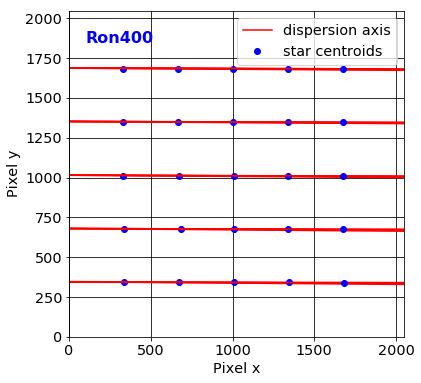

In [222]:
plot_dispersion_axis(order0_positions,all_theta,holo_name=holo_name)

Hologram center at x0 = 800.0 and y0 = 800.0 with average tilt of -0.3 degrees


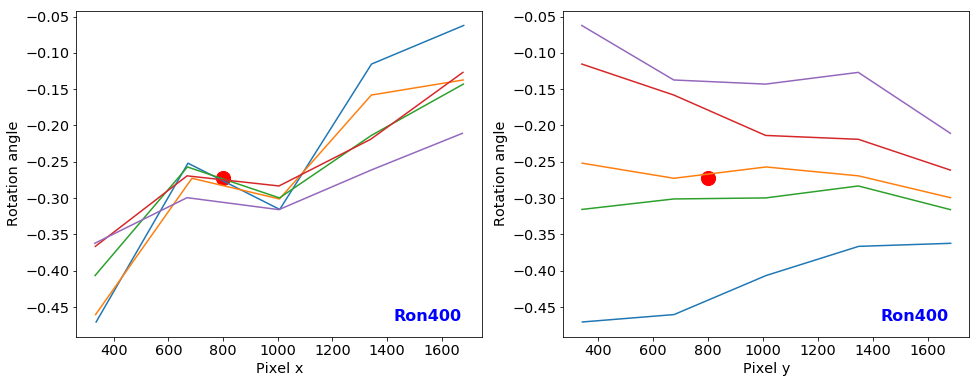

In [223]:
proj_x_lines, proj_y_lines = RotationLines(all_theta,order0_positions)
x_center, y_center, theta0 = FindHoloCenter(all_theta,order0_positions,proj_x_lines, proj_y_lines)

plot_rotation_lines(proj_x_lines,proj_y_lines,holo_name=holo_name,center=[x_center, y_center, theta0])

### with surface analysis

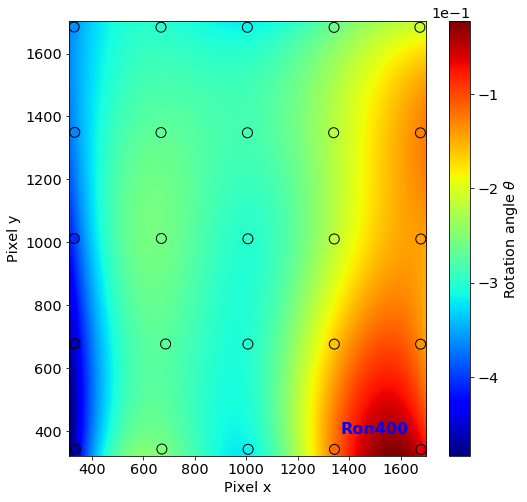

In [224]:
theta_xx,theta_yy,theta_z,theta_interp = scatter_interpol(order0_positions,all_theta,margin=10,kind='cubic',
                                        plot=True,holo_name=holo_name,zlabel='Rotation angle $\\theta$')

## Save results

In [170]:
dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
print 'Save results in ',dirname
print '--------------------------------------------------------------'
#textfilename=os.path.join(dirname,'hologram_rotation_angles.txt')
#print textfilename
#out = []
#for index in range(len(all_theta)):
#    out.append([order0_positions[index][0], order0_positions[index][1], all_theta[index]])
#np.savetxt(textfilename,np.array(out),header="x_star y_star theta_in_degree",fmt='%.3f')

#textfilename=os.path.join(dirname,'hologram_grooves_per_mm.txt')
#print textfilename
#out = []
#for index in range(len(all_theta)):
#    out.append([order0_positions[index][0], order0_positions[index][1], N_rightorder[index]])
#np.savetxt(textfilename,np.array(out),header="x_star y_star grooves_per_mm grooves_per_mm_err",fmt='%.3f')

#text = "#x_center y_center theta_tilt_in_degree\n" 
#text += "%.3f %.3f %.3f\n" % (x_center, y_center, theta_tilt)
#textfilename = dirname+"/hologram_center.txt"
#print textfilename
#f=open(textfilename,'w')
#f.write(text)
#f.close()

Save results in  ../../common_tools/data/HoloAmAg
--------------------------------------------------------------
../../common_tools/data/HoloAmAg/hologram_rotation_angles.txt
../../common_tools/data/HoloAmAg/hologram_grooves_per_mm.txt
../../common_tools/data/HoloAmAg/hologram_center.txt
